In [ ]:
from __future__ import print_function
import torch
x = torch.rand(5, 3)
print(x)

# DCGAN 

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision
import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pandas as pd
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
# Root directory for dataset
dataroot = "data/Kaggle_Monkey/training"

# Number of workers for dataloader
workers = 0

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 300

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [4]:
transform = {
    'train': transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
    ]),
    'val': transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
    ])
}

In [5]:
#using torchvision ImageFolder for importing this dataset
PATH= 'Data/Kaggle_Monkey/'
trainData = torchvision.datasets.ImageFolder(root=PATH+'training',transform=transform['train'])
trainDataLoader = DataLoader(trainData,batch_size=batch_size,shuffle=True,num_workers=0)
valData = torchvision.datasets.ImageFolder(root=PATH+'validation',transform=transform['val'])
valDataLoader = DataLoader(valData,batch_size=batch_size,shuffle=True,num_workers=0)

In [6]:
#What each class signifies in this model from n0-n9
dfAllClasses = pd.read_csv(PATH+'monkey_labels.txt')
label = [str.strip(x) for x in list(dfAllClasses[dfAllClasses.columns[2]])]
label

['mantled_howler',
 'patas_monkey',
 'bald_uakari',
 'japanese_macaque',
 'pygmy_marmoset',
 'white_headed_capuchin',
 'silvery_marmoset',
 'common_squirrel_monkey',
 'black_headed_night_monkey',
 'nilgiri_langur']

In [7]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [10]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [11]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [49]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0
# real_train_n0_label = torch.tensor(train_df['n0'].values, device=device) #torch.tensor(list(train_labels), device=device)
# real_valid_n0_label = torch.tensor(val_df['n0'].values, device=device)
# fake_train_n0_label = torch.tensor(fake_train_df['n0'].values, device=device)
# fake_valid_n0_label = torch.tensor(fake_val_df['n0'].values, device=device)
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(trainDataLoader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(trainDataLoader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(trainDataLoader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/300][0/18]	Loss_D: 1.5754	Loss_G: 5.9831	D(x): 0.5134	D(G(z)): 0.4883 / 0.0035
[1/300][0/18]	Loss_D: 2.4352	Loss_G: 17.2949	D(x): 0.8732	D(G(z)): 0.8416 / 0.0000
[2/300][0/18]	Loss_D: 0.4420	Loss_G: 17.7705	D(x): 0.7170	D(G(z)): 0.0000 / 0.0000
[3/300][0/18]	Loss_D: 1.1793	Loss_G: 26.8346	D(x): 0.5571	D(G(z)): 0.0000 / 0.0000
[4/300][0/18]	Loss_D: 0.1389	Loss_G: 9.0387	D(x): 0.9161	D(G(z)): 0.0002 / 0.0002
[5/300][0/18]	Loss_D: 1.1150	Loss_G: 15.0211	D(x): 0.9159	D(G(z)): 0.5424 / 0.0000
[6/300][0/18]	Loss_D: 1.2894	Loss_G: 3.2095	D(x): 0.4490	D(G(z)): 0.0664 / 0.0891
[7/300][0/18]	Loss_D: 0.5208	Loss_G: 3.1630	D(x): 0.8508	D(G(z)): 0.2354 / 0.0623
[8/300][0/18]	Loss_D: 3.3864	Loss_G: 6.9265	D(x): 0.2183	D(G(z)): 0.0088 / 0.0225
[9/300][0/18]	Loss_D: 0.8182	Loss_G: 2.7748	D(x): 0.5723	D(G(z)): 0.1105 / 0.1308
[10/300][0/18]	Loss_D: 1.1243	Loss_G: 8.5178	D(x): 0.9600	D(G(z)): 0.5558 / 0.0003
[11/300][0/18]	Loss_D: 0.4332	Loss_G: 4.5611	D(x): 0.8871	D(G(z)): 

[99/300][0/18]	Loss_D: 0.5806	Loss_G: 3.2015	D(x): 0.7366	D(G(z)): 0.1730 / 0.0667
[100/300][0/18]	Loss_D: 0.6457	Loss_G: 2.6784	D(x): 0.6249	D(G(z)): 0.0338 / 0.1527
[101/300][0/18]	Loss_D: 0.6010	Loss_G: 6.3457	D(x): 0.8718	D(G(z)): 0.2825 / 0.0041
[102/300][0/18]	Loss_D: 0.7986	Loss_G: 5.4024	D(x): 0.9537	D(G(z)): 0.4489 / 0.0092
[103/300][0/18]	Loss_D: 0.6894	Loss_G: 5.8856	D(x): 0.9258	D(G(z)): 0.3839 / 0.0061
[104/300][0/18]	Loss_D: 1.4162	Loss_G: 6.8752	D(x): 0.9591	D(G(z)): 0.6125 / 0.0048
[105/300][0/18]	Loss_D: 0.4730	Loss_G: 5.1021	D(x): 0.8976	D(G(z)): 0.2625 / 0.0110
[106/300][0/18]	Loss_D: 0.3146	Loss_G: 3.4994	D(x): 0.8752	D(G(z)): 0.1444 / 0.0478
[107/300][0/18]	Loss_D: 0.3507	Loss_G: 3.6551	D(x): 0.8345	D(G(z)): 0.1153 / 0.0491
[108/300][0/18]	Loss_D: 0.3979	Loss_G: 5.3390	D(x): 0.9419	D(G(z)): 0.2401 / 0.0083
[109/300][0/18]	Loss_D: 1.5288	Loss_G: 9.3924	D(x): 0.9886	D(G(z)): 0.7207 / 0.0004
[110/300][0/18]	Loss_D: 0.3707	Loss_G: 4.6110	D(x): 0.8616	D(G(z)): 0.1435 / 

[197/300][0/18]	Loss_D: 0.3424	Loss_G: 7.0935	D(x): 0.9863	D(G(z)): 0.2270 / 0.0017
[198/300][0/18]	Loss_D: 0.1106	Loss_G: 5.2145	D(x): 0.9583	D(G(z)): 0.0579 / 0.0116
[199/300][0/18]	Loss_D: 0.0881	Loss_G: 5.1374	D(x): 0.9851	D(G(z)): 0.0635 / 0.0098
[200/300][0/18]	Loss_D: 0.1698	Loss_G: 5.4810	D(x): 0.9907	D(G(z)): 0.1236 / 0.0059
[201/300][0/18]	Loss_D: 0.5461	Loss_G: 9.9312	D(x): 0.9966	D(G(z)): 0.3515 / 0.0001
[202/300][0/18]	Loss_D: 0.0907	Loss_G: 5.1133	D(x): 0.9868	D(G(z)): 0.0702 / 0.0113
[203/300][0/18]	Loss_D: 0.0884	Loss_G: 4.7085	D(x): 0.9896	D(G(z)): 0.0725 / 0.0140
[204/300][0/18]	Loss_D: 0.0654	Loss_G: 5.1515	D(x): 0.9743	D(G(z)): 0.0337 / 0.0103
[205/300][0/18]	Loss_D: 0.1326	Loss_G: 5.2067	D(x): 0.9836	D(G(z)): 0.0983 / 0.0095
[206/300][0/18]	Loss_D: 0.1667	Loss_G: 5.6054	D(x): 0.9910	D(G(z)): 0.1203 / 0.0058
[207/300][0/18]	Loss_D: 0.1838	Loss_G: 6.0601	D(x): 0.9909	D(G(z)): 0.1398 / 0.0039
[208/300][0/18]	Loss_D: 0.1241	Loss_G: 5.7311	D(x): 0.9890	D(G(z)): 0.0986 /

[295/300][0/18]	Loss_D: 0.8373	Loss_G: 5.5402	D(x): 0.6334	D(G(z)): 0.0224 / 0.0561
[296/300][0/18]	Loss_D: 0.8942	Loss_G: 8.2643	D(x): 0.9801	D(G(z)): 0.4431 / 0.0024
[297/300][0/18]	Loss_D: 0.4423	Loss_G: 6.7864	D(x): 0.9507	D(G(z)): 0.2501 / 0.0032
[298/300][0/18]	Loss_D: 0.4909	Loss_G: 6.7972	D(x): 0.9784	D(G(z)): 0.2862 / 0.0028
[299/300][0/18]	Loss_D: 0.4181	Loss_G: 7.3773	D(x): 0.9762	D(G(z)): 0.2772 / 0.0014


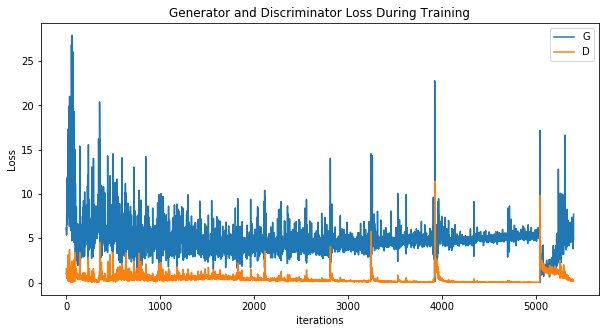

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


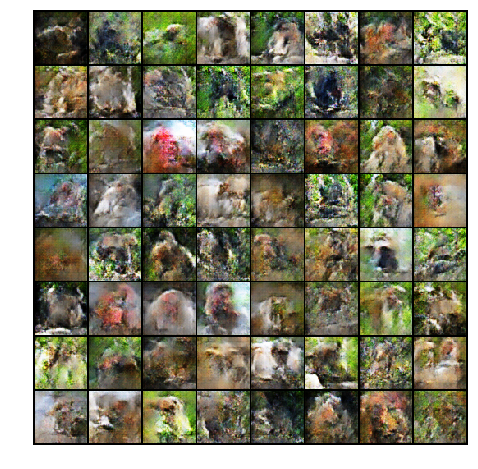

In [15]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

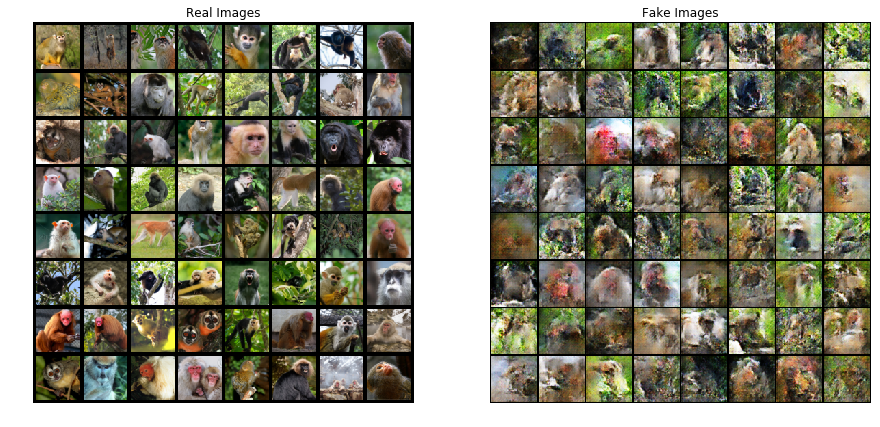

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(valDataLoader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [ ]:
## generating images

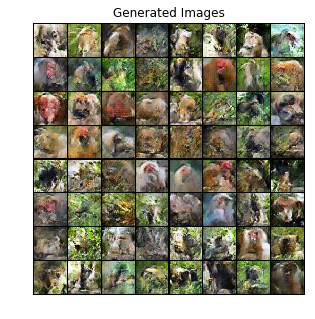

In [17]:
noise = torch.randn(64, 100, 1, 1, device=device)

# Turn off gradient calculation to speed up the process.
with torch.no_grad():
	# Get generated image from the noise vector using
	# the trained generator.
    generated_img = netG(noise).detach().cpu()

# Display the generated image.
plt.figure(figsize=(10,5))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(generated_img, padding=2, normalize=True), (1,2,0)))

plt.show()

In [18]:
import torchnet.meter.confusionmeter as cm
import pandas as  pd
import seaborn as sn

In [19]:
def blockshaped(arr, nrows, ncols):
    """
    Return an array of shape (n, nrows, ncols) where
    n * nrows * ncols = arr.size

    If arr is a 2D array, the returned array should look like n subblocks with
    each subblock preserving the "physical" layout of arr.
    """
    arr= arr.numpy()
    h, w = arr.shape
    assert h % nrows == 0, "{} rows is not evenly divisble by {}".format(h, nrows)
    assert w % ncols == 0, "{} cols is not evenly divisble by {}".format(w, ncols)
    return (arr.reshape(h//nrows, nrows, -1, ncols)
               .swapaxes(1,2)
               .reshape(-1, nrows, ncols))

In [20]:
class_names=['real','fake']

In [70]:
# For each batch in the dataloader
for i, data in enumerate(trainDataLoader, 0):

    # Format batch
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
#     print(real_cpu.shape)
    label = torch.full((b_size,), real_label, device=device)
#     print(label.shape)
    # Forward pass real batch through D
    output = netD(real_cpu)
    _, predicted = torch.max(output, 1)
    predicted=predicted.reshape(-1,)
#     ///print(predicted.shape)
    total += real_labels.size(0)
    correct += (predicted == label).sum().item()

print('Accuracy of the network on the test images: %d %%' % (100 * correct / total))

Accuracy of the network on the test images: 3 %


In [71]:
# #Get the confusion matrix for testing data
# confusion_matrix = cm.ConfusionMeter(2)
# with torch.no_grad():
#     for i, (inputs, labels) in enumerate(valDataLoader):
#         inputs = inputs.to(device)
#         real_labels = torch.ones(inputs.shape[0])
#         print(inputs.shape)
#         print(real_labels.shape)
#         discrim_outputs= netD(inputs)
#         discrim_outputs=discrim_outputs.reshape(discrim_outputs.shape[0],1)
# #         print(discrim_outputs.shape)
# #         
#         _,predicted=torch.max(discrim_outputs.data,1)
# #         print(predicted)
# #         print(labels.shape)
#         confusion_matrix.add(predicted, real_labels)

#         con_m = confusion_matrix.conf
#         df_con_m = pd.DataFrame(con_m, index= [i for i in class_names], columns = [i for i in class_names])
#         print(df_con_m)

torch.Size([64, 3, 64, 64])
torch.Size([64])
      real  fake
real     0     0
fake    64     0
torch.Size([64, 3, 64, 64])
torch.Size([64])
      real  fake
real     0     0
fake   128     0
torch.Size([64, 3, 64, 64])
torch.Size([64])
      real  fake
real     0     0
fake   192     0
torch.Size([64, 3, 64, 64])
torch.Size([64])
      real  fake
real     0     0
fake   256     0
torch.Size([16, 3, 64, 64])
torch.Size([16])
      real  fake
real     0     0
fake   272     0
